<a href="https://colab.research.google.com/github/anilbhatt1/Deep_Learning_EVA6_Phase1/blob/main/EVA6_S8_Gradcam_Resnet_V3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Sat Jul  3 13:48:50 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.27       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   65C    P8    11W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
# Mounting the drive and copying the code from github to drive
from google.colab import drive 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
!git clone https://github.com/anilbhatt1/Deep_Learning_EVA6_Phase1
%cd Deep_Learning_EVA6_Phase1/src
! ls

Cloning into 'Deep_Learning_EVA6_Phase1'...
remote: Enumerating objects: 452, done.
remote: Counting objects: 100% (112/112), done.
remote: Compressing objects: 100% (112/112), done.
remote: Total 452 (delta 67), reused 0 (delta 0), pack-reused 340
Receiving objects: 100% (452/452), 9.57 MiB | 41.36 MiB/s, done.
Resolving deltas: 100% (241/241), done.
/content/Deep_Learning_EVA6_Phase1/src
Alb_transforms.py  README.md		       test_loss.py
main.py		   s7_model.py		       train_loss.py
models.py	   s8_resnet_cifar10_model.py  utilities.py


In [4]:
!pip install albumentations==1.0.0

     |████████████████████████████████| 102kB 10.6MB/s 
     |████████████████████████████████| 38.2MB 79kB/s 
  Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torchvision import datasets, transforms
import numpy as np
import cv2
import PIL
from PIL import Image as img
from tqdm import tqdm
import matplotlib.pyplot as plt
import albumentations as A
cuda = torch.cuda.is_available()
import datetime
from torch.utils.tensorboard import SummaryWriter
print(f'Albumentations Version : {A.__version__}, Pytorch Version : {torch.__version__}, cuda:{cuda}')
%load_ext tensorboard

Albumentations Version : 1.0.0, Pytorch Version : 1.9.0+cu102, cuda:True


In [6]:
import main

/usr/local/lib/python3.7/dist-packages/albumentations/augmentations/transforms.py:645: FutureWarning: This class has been deprecated. Please use CoarseDropout
  FutureWarning,



Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


images.size() : torch.Size([128, 3, 32, 32]), labels.size() : torch.Size([128])
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
         GroupNorm-2           [-1, 64, 32, 32]             128
            Conv2d-3           [-1, 64, 32, 32]          36,864
         GroupNorm-4           [-1, 64, 32, 32]             128
            Conv2d-5           [-1, 64, 32, 32]          36,864
         GroupNorm-6           [-1, 64, 32, 32]             128
        BasicBlock-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
         GroupNorm-9           [-1, 64, 32, 32]             128
           Conv2d-10           [-1, 64, 32, 32]          36,864
        GroupNorm-11           [-1, 64, 32, 32]             128
       BasicBlock-12           [-1, 64, 32, 32]               0
           Conv2d-13   

/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)
  0%|          | 0/391 [00:00<?, ?it/s]

EPOCH: 0


Loss=2.198037624359131 Batch_id=390 Train Accuracy=17.52: 100%|██████████| 391/391 [01:09<00:00,  5.62it/s]

Train set: Epoch : 0/40 Average loss: 2.1980, Train Accuracy: 17.52



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 0/40 Average loss: 2.1764, Test Accuracy: 20.3
EPOCH: 1


Loss=1.5598902702331543 Batch_id=390 Train Accuracy=29.70: 100%|██████████| 391/391 [01:09<00:00,  5.60it/s]

Train set: Epoch : 1/40 Average loss: 1.5599, Train Accuracy: 29.7



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 1/40 Average loss: 1.7025, Test Accuracy: 34.88
EPOCH: 2


Loss=1.503829002380371 Batch_id=390 Train Accuracy=37.72: 100%|██████████| 391/391 [01:10<00:00,  5.53it/s]

Train set: Epoch : 2/40 Average loss: 1.5038, Train Accuracy: 37.72



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 2/40 Average loss: 1.4997, Test Accuracy: 43.55
EPOCH: 3


Loss=1.4119371175765991 Batch_id=390 Train Accuracy=43.44: 100%|██████████| 391/391 [01:10<00:00,  5.53it/s]

Train set: Epoch : 3/40 Average loss: 1.4119, Train Accuracy: 43.44



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 3/40 Average loss: 1.3302, Test Accuracy: 51.32
EPOCH: 4


Loss=1.3055096864700317 Batch_id=390 Train Accuracy=48.76: 100%|██████████| 391/391 [01:10<00:00,  5.53it/s]

Train set: Epoch : 4/40 Average loss: 1.3055, Train Accuracy: 48.76



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 4/40 Average loss: 1.1955, Test Accuracy: 56.08
EPOCH: 5


Loss=1.2971397638320923 Batch_id=390 Train Accuracy=52.54: 100%|██████████| 391/391 [01:10<00:00,  5.53it/s]

Train set: Epoch : 5/40 Average loss: 1.2971, Train Accuracy: 52.54



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 5/40 Average loss: 1.1489, Test Accuracy: 58.29
EPOCH: 6


Loss=1.1648039817810059 Batch_id=390 Train Accuracy=56.10: 100%|██████████| 391/391 [01:11<00:00,  5.50it/s]

Train set: Epoch : 6/40 Average loss: 1.1648, Train Accuracy: 56.1



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 6/40 Average loss: 1.0354, Test Accuracy: 62.16
EPOCH: 7


Loss=1.1721935272216797 Batch_id=390 Train Accuracy=59.33: 100%|██████████| 391/391 [01:11<00:00,  5.50it/s]

Train set: Epoch : 7/40 Average loss: 1.1722, Train Accuracy: 59.33



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 7/40 Average loss: 1.0565, Test Accuracy: 62.23
EPOCH: 8


Loss=1.3338698148727417 Batch_id=390 Train Accuracy=62.01: 100%|██████████| 391/391 [01:11<00:00,  5.50it/s]

Train set: Epoch : 8/40 Average loss: 1.3339, Train Accuracy: 62.01



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 8/40 Average loss: 0.9892, Test Accuracy: 64.7
EPOCH: 9


Loss=1.058346152305603 Batch_id=390 Train Accuracy=64.09: 100%|██████████| 391/391 [01:10<00:00,  5.51it/s]

Train set: Epoch : 9/40 Average loss: 1.0583, Train Accuracy: 64.09



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 9/40 Average loss: 1.0464, Test Accuracy: 63.94
EPOCH: 10


Loss=0.8914887309074402 Batch_id=390 Train Accuracy=66.03: 100%|██████████| 391/391 [01:11<00:00,  5.51it/s]

Train set: Epoch : 10/40 Average loss: 0.8915, Train Accuracy: 66.03



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 10/40 Average loss: 0.8468, Test Accuracy: 69.36
EPOCH: 11


Loss=0.9036486744880676 Batch_id=390 Train Accuracy=67.51: 100%|██████████| 391/391 [01:10<00:00,  5.54it/s]

Train set: Epoch : 11/40 Average loss: 0.9036, Train Accuracy: 67.51



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 11/40 Average loss: 0.8833, Test Accuracy: 69.75
EPOCH: 12


Loss=0.9745030403137207 Batch_id=390 Train Accuracy=69.26: 100%|██████████| 391/391 [01:10<00:00,  5.55it/s]

Train set: Epoch : 12/40 Average loss: 0.9745, Train Accuracy: 69.26



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 12/40 Average loss: 0.8951, Test Accuracy: 69.09
EPOCH: 13


Loss=0.6155837178230286 Batch_id=390 Train Accuracy=71.05: 100%|██████████| 391/391 [01:10<00:00,  5.53it/s]

Train set: Epoch : 13/40 Average loss: 0.6156, Train Accuracy: 71.05



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 13/40 Average loss: 0.7899, Test Accuracy: 72.89
EPOCH: 14


Loss=0.7513153553009033 Batch_id=390 Train Accuracy=72.58: 100%|██████████| 391/391 [01:10<00:00,  5.51it/s]

Train set: Epoch : 14/40 Average loss: 0.7513, Train Accuracy: 72.58



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 14/40 Average loss: 0.6660, Test Accuracy: 76.85
EPOCH: 15


Loss=0.8370744585990906 Batch_id=390 Train Accuracy=73.85: 100%|██████████| 391/391 [01:10<00:00,  5.55it/s]

Train set: Epoch : 15/40 Average loss: 0.8371, Train Accuracy: 73.85



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 15/40 Average loss: 0.6505, Test Accuracy: 77.45
EPOCH: 16


Loss=0.7768536806106567 Batch_id=390 Train Accuracy=75.39: 100%|██████████| 391/391 [01:10<00:00,  5.54it/s]

Train set: Epoch : 16/40 Average loss: 0.7769, Train Accuracy: 75.39



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 16/40 Average loss: 0.6171, Test Accuracy: 78.68
EPOCH: 17


Loss=0.6306535005569458 Batch_id=390 Train Accuracy=76.40: 100%|██████████| 391/391 [01:10<00:00,  5.51it/s]

Train set: Epoch : 17/40 Average loss: 0.6307, Train Accuracy: 76.4



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 17/40 Average loss: 0.5908, Test Accuracy: 79.61
EPOCH: 18


Loss=0.7097145318984985 Batch_id=390 Train Accuracy=77.27: 100%|██████████| 391/391 [01:10<00:00,  5.55it/s]

Train set: Epoch : 18/40 Average loss: 0.7097, Train Accuracy: 77.27



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 18/40 Average loss: 0.5681, Test Accuracy: 80.07
EPOCH: 19


Loss=0.6794224381446838 Batch_id=390 Train Accuracy=78.03: 100%|██████████| 391/391 [01:10<00:00,  5.53it/s]

Train set: Epoch : 19/40 Average loss: 0.6794, Train Accuracy: 78.03



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 19/40 Average loss: 0.5671, Test Accuracy: 80.52
EPOCH: 20


Loss=0.7439192533493042 Batch_id=390 Train Accuracy=79.59: 100%|██████████| 391/391 [01:10<00:00,  5.52it/s]

Train set: Epoch : 20/40 Average loss: 0.7439, Train Accuracy: 79.59



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 20/40 Average loss: 0.5569, Test Accuracy: 81.28
EPOCH: 21


Loss=0.5152500867843628 Batch_id=390 Train Accuracy=80.10: 100%|██████████| 391/391 [01:10<00:00,  5.54it/s]

Train set: Epoch : 21/40 Average loss: 0.5153, Train Accuracy: 80.1



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 21/40 Average loss: 0.5343, Test Accuracy: 80.95
EPOCH: 22


Loss=0.5126231908798218 Batch_id=390 Train Accuracy=81.09: 100%|██████████| 391/391 [01:10<00:00,  5.54it/s]

Train set: Epoch : 22/40 Average loss: 0.5126, Train Accuracy: 81.09



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 22/40 Average loss: 0.4916, Test Accuracy: 82.95
EPOCH: 23


Loss=0.6797115802764893 Batch_id=390 Train Accuracy=81.55: 100%|██████████| 391/391 [01:10<00:00,  5.54it/s]

Train set: Epoch : 23/40 Average loss: 0.6797, Train Accuracy: 81.55



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 23/40 Average loss: 0.5008, Test Accuracy: 82.5
EPOCH: 24


Loss=0.6429924368858337 Batch_id=390 Train Accuracy=82.12: 100%|██████████| 391/391 [01:10<00:00,  5.54it/s]

Train set: Epoch : 24/40 Average loss: 0.6430, Train Accuracy: 82.12



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 24/40 Average loss: 0.5112, Test Accuracy: 83.06
EPOCH: 25


Loss=0.5065513849258423 Batch_id=390 Train Accuracy=83.09: 100%|██████████| 391/391 [01:10<00:00,  5.52it/s]

Train set: Epoch : 25/40 Average loss: 0.5066, Train Accuracy: 83.09



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 25/40 Average loss: 0.4605, Test Accuracy: 84.03
EPOCH: 26


Loss=0.49683821201324463 Batch_id=390 Train Accuracy=83.58: 100%|██████████| 391/391 [01:10<00:00,  5.51it/s]

Train set: Epoch : 26/40 Average loss: 0.4968, Train Accuracy: 83.58



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 26/40 Average loss: 0.4298, Test Accuracy: 85.38
EPOCH: 27


Loss=0.4597892165184021 Batch_id=390 Train Accuracy=84.10: 100%|██████████| 391/391 [01:10<00:00,  5.54it/s]

Train set: Epoch : 27/40 Average loss: 0.4598, Train Accuracy: 84.1



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 27/40 Average loss: 0.4477, Test Accuracy: 84.34
EPOCH: 28


Loss=0.5040075182914734 Batch_id=390 Train Accuracy=84.39: 100%|██████████| 391/391 [01:10<00:00,  5.52it/s]

Train set: Epoch : 28/40 Average loss: 0.5040, Train Accuracy: 84.39



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 28/40 Average loss: 0.4427, Test Accuracy: 84.79
EPOCH: 29


Loss=0.42487385869026184 Batch_id=390 Train Accuracy=85.20: 100%|██████████| 391/391 [01:10<00:00,  5.52it/s]

Train set: Epoch : 29/40 Average loss: 0.4249, Train Accuracy: 85.2



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 29/40 Average loss: 0.4075, Test Accuracy: 86.0
EPOCH: 30


Loss=0.3610425293445587 Batch_id=390 Train Accuracy=85.23: 100%|██████████| 391/391 [01:10<00:00,  5.52it/s]

Train set: Epoch : 30/40 Average loss: 0.3610, Train Accuracy: 85.23



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 30/40 Average loss: 0.3913, Test Accuracy: 86.96
EPOCH: 31


Loss=0.3719157874584198 Batch_id=390 Train Accuracy=86.10: 100%|██████████| 391/391 [01:10<00:00,  5.53it/s]

Train set: Epoch : 31/40 Average loss: 0.3719, Train Accuracy: 86.1



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 31/40 Average loss: 0.4145, Test Accuracy: 86.15
EPOCH: 32


Loss=0.4047006666660309 Batch_id=390 Train Accuracy=86.47: 100%|██████████| 391/391 [01:10<00:00,  5.53it/s]

Train set: Epoch : 32/40 Average loss: 0.4047, Train Accuracy: 86.47



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 32/40 Average loss: 0.3899, Test Accuracy: 86.74
EPOCH: 33


Loss=0.3550313115119934 Batch_id=390 Train Accuracy=86.78: 100%|██████████| 391/391 [01:10<00:00,  5.54it/s]

Train set: Epoch : 33/40 Average loss: 0.3550, Train Accuracy: 86.78



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 33/40 Average loss: 0.4577, Test Accuracy: 85.08
EPOCH: 34


Loss=0.40014123916625977 Batch_id=390 Train Accuracy=87.11: 100%|██████████| 391/391 [01:10<00:00,  5.53it/s]

Train set: Epoch : 34/40 Average loss: 0.4001, Train Accuracy: 87.11



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 34/40 Average loss: 0.4232, Test Accuracy: 86.25
EPOCH: 35


Loss=0.3349160850048065 Batch_id=390 Train Accuracy=87.48: 100%|██████████| 391/391 [01:10<00:00,  5.53it/s]

Train set: Epoch : 35/40 Average loss: 0.3349, Train Accuracy: 87.48



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 35/40 Average loss: 0.3977, Test Accuracy: 87.08
EPOCH: 36


Loss=0.2126256376504898 Batch_id=390 Train Accuracy=88.15: 100%|██████████| 391/391 [01:10<00:00,  5.54it/s]

Train set: Epoch : 36/40 Average loss: 0.2126, Train Accuracy: 88.15



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 36/40 Average loss: 0.3990, Test Accuracy: 86.81
EPOCH: 37


Loss=0.2694992423057556 Batch_id=390 Train Accuracy=88.30: 100%|██████████| 391/391 [01:10<00:00,  5.53it/s]

Train set: Epoch : 37/40 Average loss: 0.2695, Train Accuracy: 88.3



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 37/40 Average loss: 0.3890, Test Accuracy: 87.7
EPOCH: 38


Loss=0.31361719965934753 Batch_id=390 Train Accuracy=88.62: 100%|██████████| 391/391 [01:10<00:00,  5.53it/s]

Train set: Epoch : 38/40 Average loss: 0.3136, Train Accuracy: 88.62



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 38/40 Average loss: 0.3865, Test Accuracy: 87.48
EPOCH: 39


Loss=0.3707975447177887 Batch_id=390 Train Accuracy=88.95: 100%|██████████| 391/391 [01:10<00:00,  5.53it/s]

Train set: Epoch : 39/40 Average loss: 0.3708, Train Accuracy: 88.95


Test set: Epoch : 39/40 Average loss: 0.3542, Test Accuracy: 88.1
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
Generating Grad-CAM @layer4


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


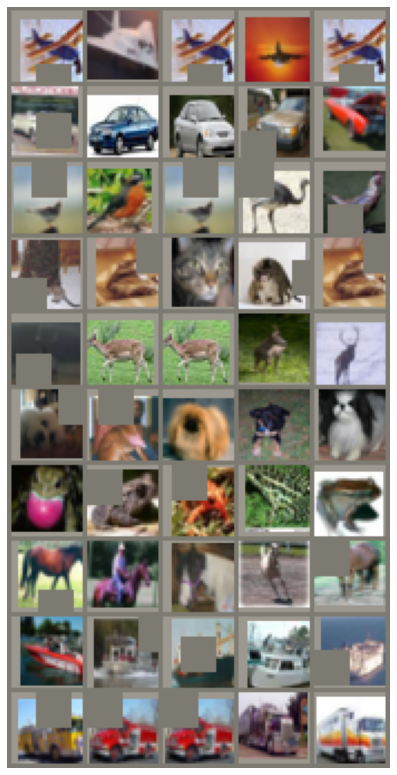

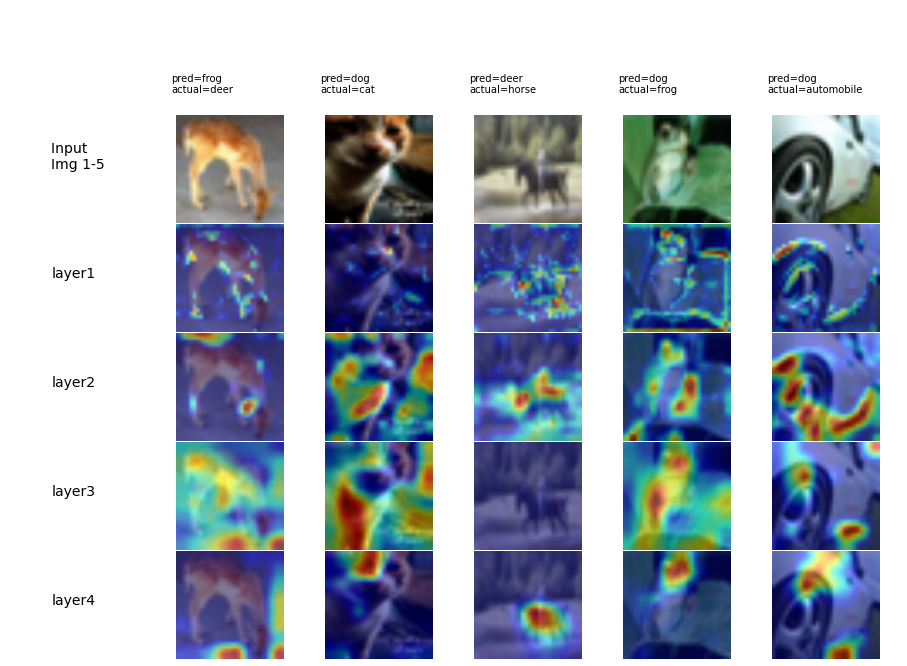

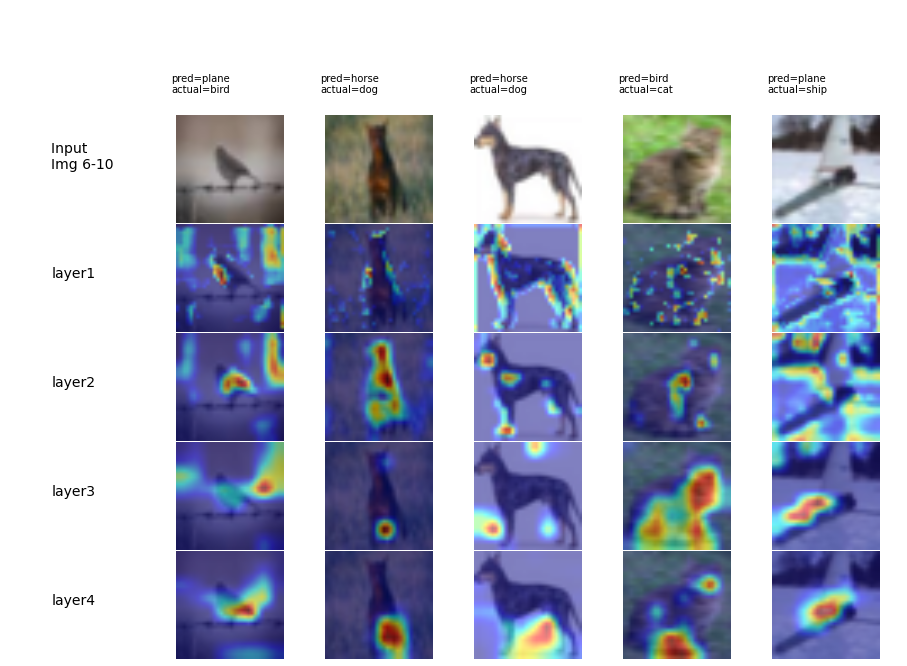

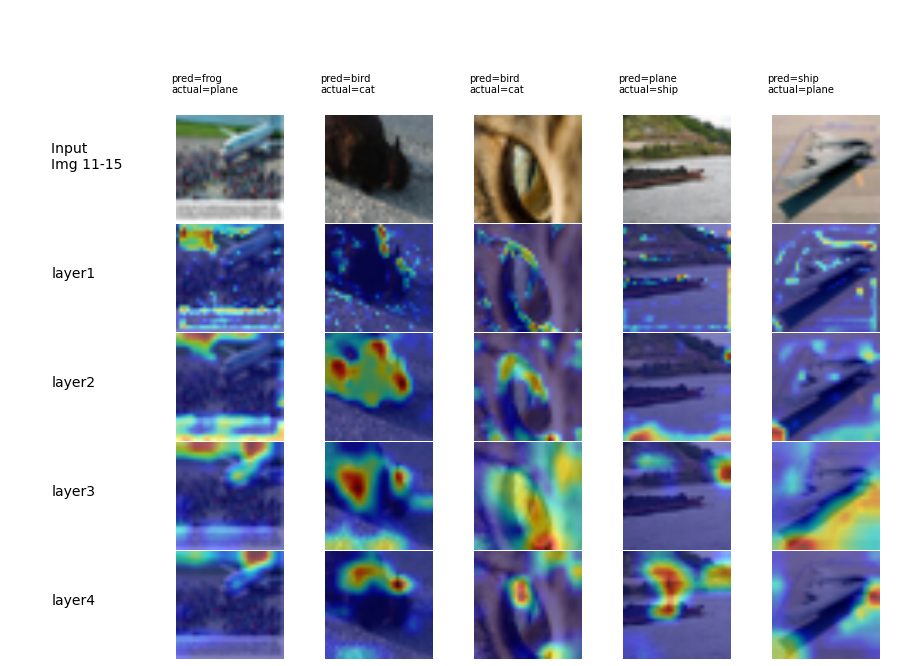

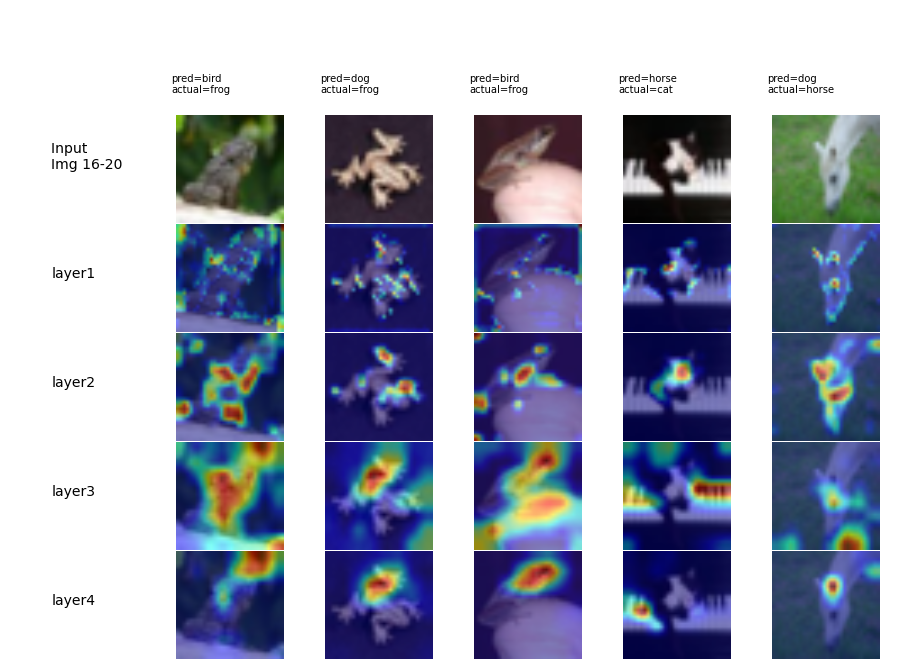

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


** Plotting misclassified test images from last epoch for CIFAR-10 **




Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


' run_main() ended successfully '

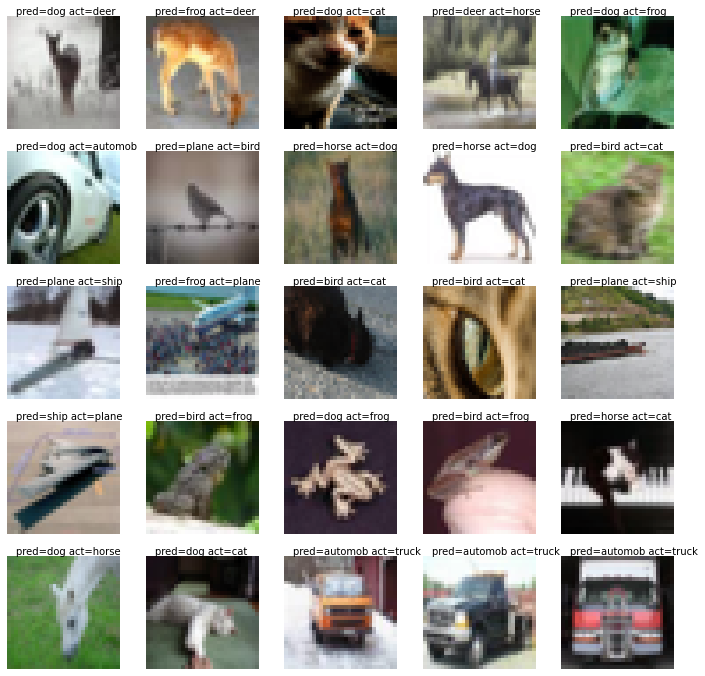

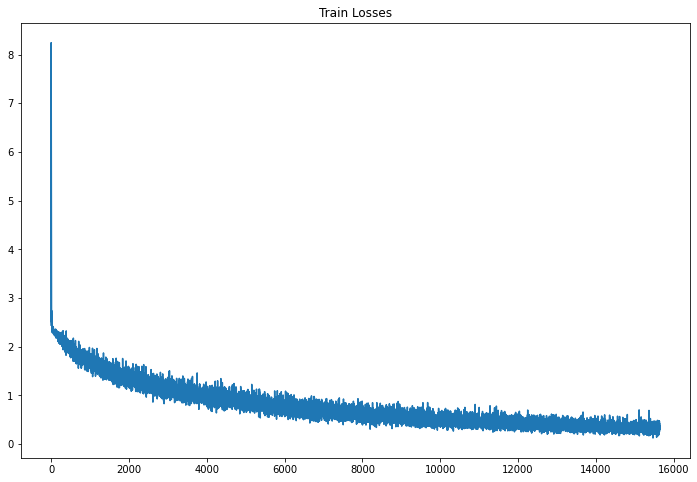

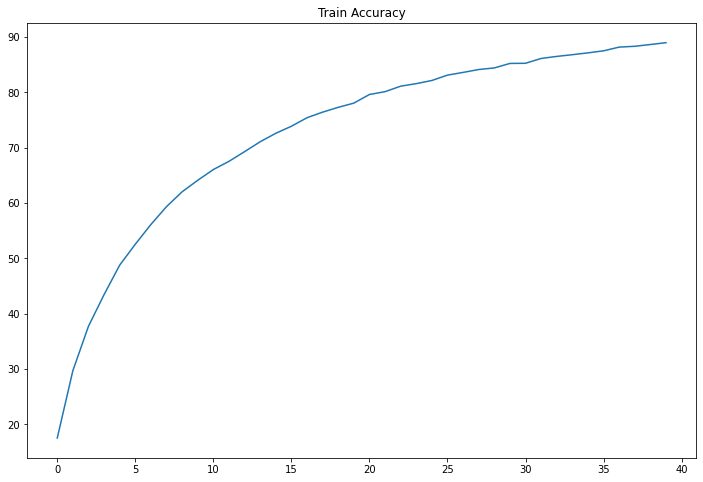

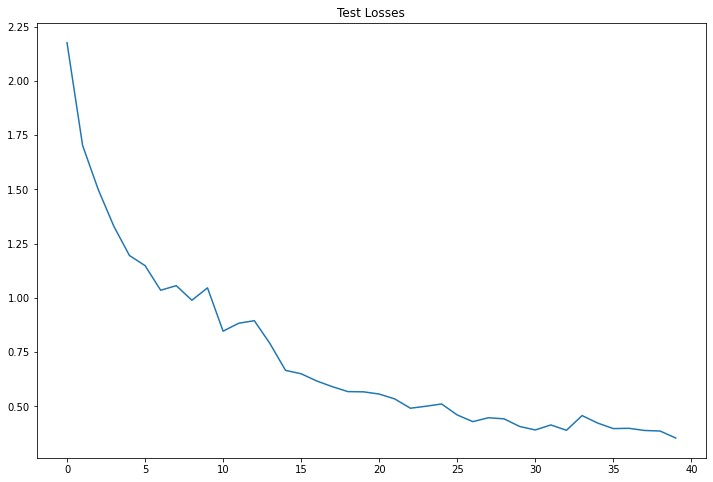

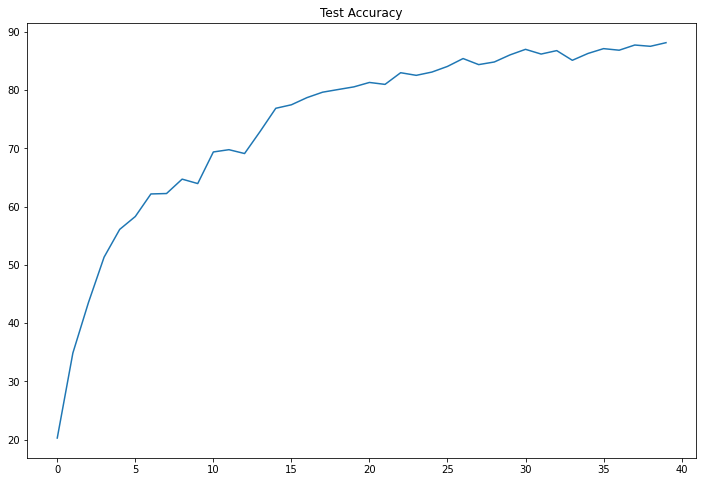

In [7]:
num_epochs = 40
main.run_main(num_epochs)

In [8]:
%tensorboard --logdir /content/gdrive/MyDrive/EVA6_P1_S8

<IPython.core.display.Javascript object>